# Reading Data

In [1]:
from google.colab import drive
drive.mount('/content/drive')

!pip install roboflow ultralytics

from roboflow import Roboflow
rf = Roboflow(api_key="kht76kLPGLFKqWribVJ9")
project = rf.workspace("kp-j5yjh").project("assistance-gesture-alert")
version = project.version(1)
dataset = version.download("yolov11")

Mounted at /content/drive
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.9/86.9 kB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 23.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 70.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 56.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 117.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 121.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 95.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 65.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━


Extracting Dataset Version Zip to Assistance-Gesture-Alert-1 in yolov11:: 100%|██████████| 5166/5166 [00:00<00:00, 7243.52it/s]


# Importing Libraries

In [2]:
import os
import random
import cv2
import yaml
import random
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image as PILImage
from ultralytics import YOLO
from IPython.display import display, Image
import warnings
warnings.filterwarnings('ignore')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


# Discription File For The Custom Dataset

In [3]:
%cd {dataset.location}

train_path = os.path.join(dataset.location, 'train/images')
val_path = os.path.join(dataset.location, 'valid/images')
test_path = os.path.join(dataset.location, 'test/images')

yaml_content = f"""
path: {dataset.location}
train: {train_path}
val: {val_path}
test: {test_path}

nc: 3
names: ['crossing-arms', 'holding-chin', 'raising-hand']
"""

output_yaml_path = '/content/drive/MyDrive/Kerja Praktik Internal/FATHAN_ASSISTANCE GESTURE ALERT_VER4/data.yaml'
os.makedirs(os.path.dirname(output_yaml_path), exist_ok=True)

with open(output_yaml_path, 'w') as file:
    file.write(yaml_content)

color_code = "\033[38;2;163;196;243m"
reset_code = "\033[0m"
print(f"{color_code}YAML file has been saved to {output_yaml_path}{reset_code}")

/content/Assistance-Gesture-Alert-1
YAML file has been saved to /content/drive/MyDrive/Kerja Praktik Internal/FATHAN_ASSISTANCE GESTURE ALERT_VER4/data.yaml


In [4]:
with open(output_yaml_path, 'r') as file:
    data = yaml.safe_load(file)
class_names = data['names']
print(f"{color_code}Class Names:{reset_code} {class_names}")

Class Names: ['crossing-arms', 'holding-chin', 'raising-hand']


In [5]:
from PIL import Image as PILImage

image_files = [f for f in os.listdir(train_path) if f.endswith(('.jpg', '.png', '.jpeg'))]
random_image_file = random.choice(image_files)
random_image_path = os.path.join(train_path, random_image_file)
image = PILImage.open(random_image_path)

print(f"Random Image: {random_image_file}")
print(f"Image Size: {image.size}")
print(f"Image Mode: {image.mode}")
print(f"Number of Channels: {len(image.getbands())}")

Random Image: TWOO0130_JPG.rf.e413c44f470af710f63f6d5f53d93143.jpg
Image Size: (640, 640)
Image Mode: RGB
Number of Channels: 3


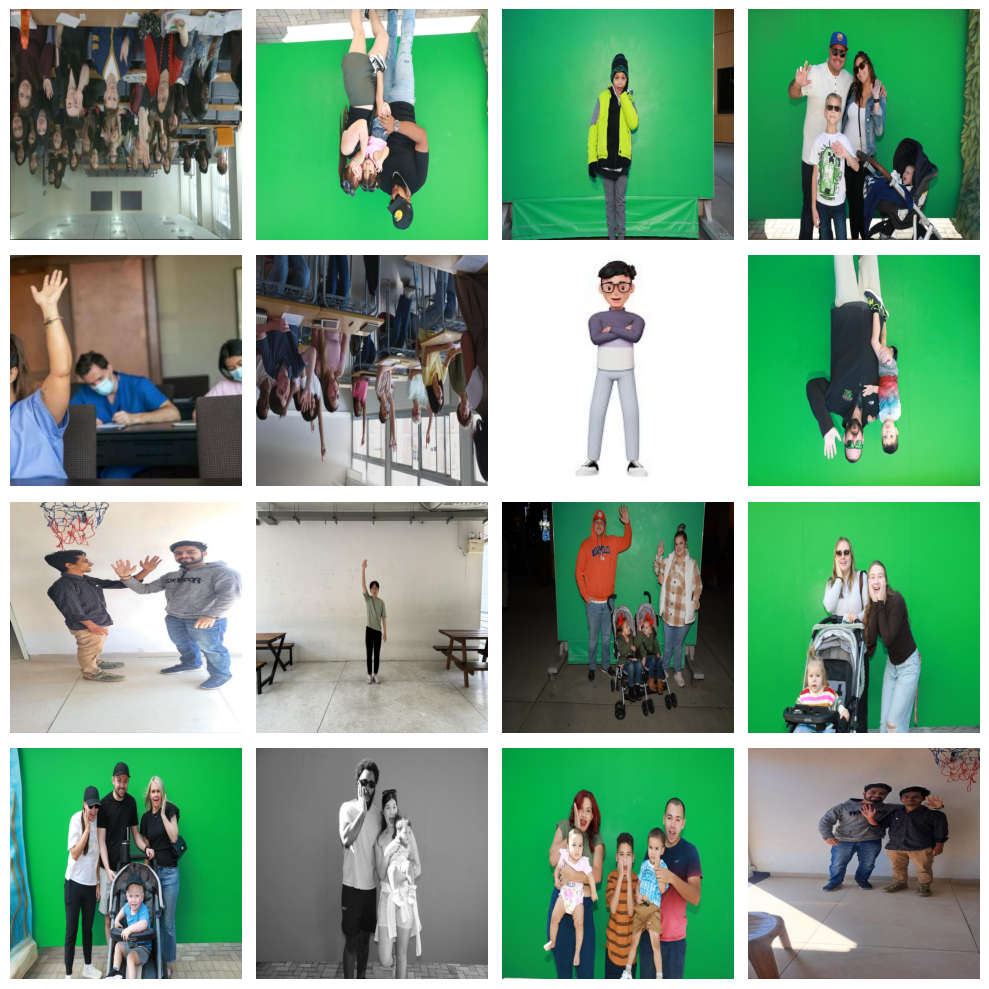

In [6]:
image_files = [f for f in os.listdir(train_path) if f.endswith('.jpg')]
selected_images = random.sample(image_files, 16)
fig, axes = plt.subplots(4, 4, figsize=(10, 10))
for i, ax in enumerate(axes.flat):
    img_path = os.path.join(train_path, selected_images[i])
    img = mpimg.imread(img_path)
    ax.imshow(img)
    ax.axis('off')
plt.tight_layout()
plt.show()

# Training

In [7]:
project_save_dir = '/content/drive/MyDrive/Kerja Praktik Internal/FATHAN_ASSISTANCE GESTURE ALERT_VER4/'

finalmodel = YOLO('yolo11n.yaml').load('/content/yolo11n.pt')

Result_finalmodel = finalmodel.train(
    data=output_yaml_path,
    epochs=50,
    imgsz=640,
    optimizer='AdamW',
    batch=16,
    lr0=0.0001,
    dropout=0.1,
    project=project_save_dir
)

100%|██████████| 5.35M/5.35M [00:00<00:00, 208MB/s]

Transferred 499/499 items from pretrained weights


Ultralytics 8.3.170 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/Kerja Praktik Internal/FATHAN_ASSISTANCE GESTURE ALERT_VER4/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.1, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.yaml, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=T

100%|██████████| 755k/755k [00:00<00:00, 111MB/s]

Overriding model.yaml nc=80 with nc=3

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics

YOLO11n summary: 181 layers, 2,590,425 parameters, 2,590,409 gradients, 6.4 GFLOPs

Transferred 448/499 items from pretrained weights
Freezing layer 'model.23.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 347MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1516.2±495.1 MB/s, size: 44.4 KB)


train: Scanning /content/Assistance-Gesture-Alert-1/train/labels... 2190 images, 2 backgrounds, 0 corrupt: 100%|██████████| 2190/2190 [00:00<00:00, 2325.56it/s]

train: New cache created: /content/Assistance-Gesture-Alert-1/train/labels.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 613.8±384.8 MB/s, size: 34.5 KB)


val: Scanning /content/Assistance-Gesture-Alert-1/valid/labels... 258 images, 1 backgrounds, 0 corrupt: 100%|██████████| 258/258 [00:00<00:00, 1244.59it/s]

val: New cache created: /content/Assistance-Gesture-Alert-1/valid/labels.cache


Plotting labels to /content/drive/MyDrive/Kerja Praktik Internal/FATHAN_ASSISTANCE GESTURE ALERT_VER4/train/labels.jpg... 
optimizer: AdamW(lr=0.0001, momentum=0.937) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/Kerja Praktik Internal/FATHAN_ASSISTANCE GESTURE ALERT_VER4/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      2.36G      1.732      2.563      1.608         51        640: 100%|██████████| 137/137 [00:46<00:00,  2.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.29it/s]

                   all        258        766     0.0715      0.499      0.248      0.139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      3.57G       1.55      1.861      1.467         74        640: 100%|██████████| 137/137 [00:41<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.57it/s]

                   all        258        766      0.768      0.427      0.402      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      3.59G      1.471      1.606      1.416         60        640: 100%|██████████| 137/137 [00:41<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.05it/s]

                   all        258        766      0.765       0.49      0.432      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50       3.6G      1.424       1.48      1.383         55        640: 100%|██████████| 137/137 [00:41<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.21it/s]

                   all        258        766      0.785      0.479       0.44      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      3.62G      1.403      1.415      1.362         73        640: 100%|██████████| 137/137 [00:41<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.43it/s]

                   all        258        766      0.782      0.616      0.613      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      3.63G      1.394      1.337      1.346         61        640: 100%|██████████| 137/137 [00:41<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.10it/s]

                   all        258        766      0.727      0.698      0.664       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      3.65G       1.37      1.309      1.335         54        640: 100%|██████████| 137/137 [00:41<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.39it/s]

                   all        258        766      0.672      0.834      0.762      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      3.66G      1.339      1.261      1.304         68        640: 100%|██████████| 137/137 [00:41<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.42it/s]

                   all        258        766      0.792      0.803      0.818      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      3.68G      1.322      1.213      1.304         26        640: 100%|██████████| 137/137 [00:40<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.35it/s]

                   all        258        766      0.813      0.721      0.776      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      3.69G      1.317      1.175      1.294         56        640: 100%|██████████| 137/137 [00:40<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.45it/s]

                   all        258        766      0.665      0.773      0.799      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      3.71G      1.307      1.138      1.281         51        640: 100%|██████████| 137/137 [00:41<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.51it/s]

                   all        258        766        0.8      0.815      0.834      0.558



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      3.72G      1.309      1.144      1.285         41        640: 100%|██████████| 137/137 [00:41<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.75it/s]

                   all        258        766      0.645      0.849      0.796       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      3.74G        1.3      1.127      1.286         49        640: 100%|██████████| 137/137 [00:40<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.24it/s]

                   all        258        766      0.774      0.693      0.811      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      3.75G      1.295      1.106      1.276         56        640: 100%|██████████| 137/137 [00:40<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.85it/s]

                   all        258        766      0.729      0.722      0.808      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      3.77G        1.3      1.084      1.275         37        640: 100%|██████████| 137/137 [00:40<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.97it/s]

                   all        258        766      0.799      0.829      0.844      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      3.78G       1.28      1.072       1.26         68        640: 100%|██████████| 137/137 [00:41<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.86it/s]

                   all        258        766      0.817      0.851      0.856      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      3.79G      1.255      1.042      1.251         45        640: 100%|██████████| 137/137 [00:41<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.90it/s]

                   all        258        766       0.79      0.741      0.794      0.571



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      3.81G      1.262      1.029      1.252         50        640: 100%|██████████| 137/137 [00:41<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.17it/s]

                   all        258        766      0.795      0.826      0.861      0.601



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      3.82G      1.238       1.01      1.236         44        640: 100%|██████████| 137/137 [00:42<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.40it/s]

                   all        258        766      0.709      0.751      0.812      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      3.84G      1.248     0.9966      1.243         51        640: 100%|██████████| 137/137 [00:41<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.36it/s]

                   all        258        766      0.739      0.736       0.82      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      3.85G      1.246     0.9969       1.24         46        640: 100%|██████████| 137/137 [00:41<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.34it/s]

                   all        258        766      0.796      0.835      0.846      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      3.87G      1.228      0.977      1.227         72        640: 100%|██████████| 137/137 [00:41<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.47it/s]

                   all        258        766      0.795      0.803      0.868      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      3.88G      1.215     0.9654      1.217         65        640: 100%|██████████| 137/137 [00:41<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.61it/s]

                   all        258        766      0.858      0.809      0.871      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50       3.9G      1.214     0.9561      1.223         47        640: 100%|██████████| 137/137 [00:41<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.40it/s]

                   all        258        766      0.807      0.733      0.838      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      3.91G      1.226     0.9496      1.223         40        640: 100%|██████████| 137/137 [00:40<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.82it/s]

                   all        258        766      0.887      0.726      0.836      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      3.93G      1.222     0.9475      1.216         50        640: 100%|██████████| 137/137 [00:40<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.56it/s]

                   all        258        766      0.753      0.798      0.829      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      3.94G      1.196     0.9333      1.214         59        640: 100%|██████████| 137/137 [00:40<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.21it/s]

                   all        258        766      0.705      0.727       0.82      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      3.96G      1.213     0.9315       1.22         44        640: 100%|██████████| 137/137 [00:40<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.83it/s]


                   all        258        766       0.81      0.822      0.864      0.598

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      3.97G      1.215     0.9268      1.213         58        640: 100%|██████████| 137/137 [00:40<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.57it/s]

                   all        258        766      0.816      0.818      0.877      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      3.99G      1.191      0.905      1.203         69        640: 100%|██████████| 137/137 [00:40<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.27it/s]

                   all        258        766      0.811      0.803      0.858      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50         4G      1.182     0.9021      1.199         56        640: 100%|██████████| 137/137 [00:41<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.04it/s]

                   all        258        766        0.8      0.818      0.881      0.621



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      4.02G      1.192     0.9027      1.208         60        640: 100%|██████████| 137/137 [00:41<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.05it/s]

                   all        258        766      0.807      0.833      0.865      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      4.03G      1.187     0.8881      1.196         35        640: 100%|██████████| 137/137 [00:41<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.29it/s]

                   all        258        766      0.825      0.839      0.871      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      4.05G      1.172     0.8812      1.196         38        640: 100%|██████████| 137/137 [00:41<00:00,  3.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.27it/s]

                   all        258        766      0.794      0.789      0.857      0.592



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      4.06G      1.174     0.8757      1.196         42        640: 100%|██████████| 137/137 [00:41<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.57it/s]

                   all        258        766      0.784       0.83      0.851      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      4.07G       1.17     0.8727      1.195         46        640: 100%|██████████| 137/137 [00:41<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.09it/s]

                   all        258        766      0.803      0.856       0.87      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      4.09G      1.167     0.8705       1.19         62        640: 100%|██████████| 137/137 [00:40<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.08it/s]

                   all        258        766      0.812      0.853      0.868      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      4.11G      1.154      0.859      1.186         46        640: 100%|██████████| 137/137 [00:41<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.30it/s]

                   all        258        766      0.713      0.866      0.853      0.582



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      4.12G      1.156      0.851      1.179         61        640: 100%|██████████| 137/137 [00:41<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.17it/s]

                   all        258        766      0.737      0.851       0.85      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      4.13G       1.16     0.8474      1.183         58        640: 100%|██████████| 137/137 [00:41<00:00,  3.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.28it/s]

                   all        258        766      0.772      0.753      0.844      0.589


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      4.15G      1.079     0.6913      1.157         28        640: 100%|██████████| 137/137 [00:41<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.50it/s]

                   all        258        766      0.756      0.739      0.833      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      4.17G      1.062     0.6755      1.147         40        640: 100%|██████████| 137/137 [00:39<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.26it/s]

                   all        258        766      0.765      0.859      0.858      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      4.18G      1.061      0.661      1.145         40        640: 100%|██████████| 137/137 [00:39<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.34it/s]

                   all        258        766      0.788      0.841      0.859       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      4.19G      1.062     0.6609      1.148         44        640: 100%|██████████| 137/137 [00:39<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.44it/s]

                   all        258        766      0.827      0.812      0.872      0.559



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      4.21G      1.046     0.6501      1.142         31        640: 100%|██████████| 137/137 [00:39<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:01<00:00,  4.58it/s]

                   all        258        766      0.805      0.813      0.871      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      4.22G      1.043     0.6467      1.132         29        640: 100%|██████████| 137/137 [00:39<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  4.17it/s]

                   all        258        766      0.777      0.824      0.871      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      4.24G      1.047     0.6444      1.134         29        640: 100%|██████████| 137/137 [00:39<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.44it/s]

                   all        258        766      0.762      0.851      0.871      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      4.25G      1.038     0.6392       1.13         51        640: 100%|██████████| 137/137 [00:38<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:03<00:00,  2.83it/s]

                   all        258        766       0.76      0.851      0.871      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      4.27G      1.035     0.6365      1.129         35        640: 100%|██████████| 137/137 [00:38<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.14it/s]

                   all        258        766      0.769      0.845      0.869      0.568



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      4.29G       1.04     0.6419      1.128         29        640: 100%|██████████| 137/137 [00:39<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:02<00:00,  3.93it/s]

                   all        258        766      0.769      0.852      0.871      0.569



50 epochs completed in 0.611 hours.
Optimizer stripped from /content/drive/MyDrive/Kerja Praktik Internal/FATHAN_ASSISTANCE GESTURE ALERT_VER4/train/weights/last.pt, 5.5MB
Optimizer stripped from /content/drive/MyDrive/Kerja Praktik Internal/FATHAN_ASSISTANCE GESTURE ALERT_VER4/train/weights/best.pt, 5.5MB

Validating /content/drive/MyDrive/Kerja Praktik Internal/FATHAN_ASSISTANCE GESTURE ALERT_VER4/train/weights/best.pt...
Ultralytics 8.3.170 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  1.87it/s]


                   all        258        766      0.798      0.817      0.881      0.621
         crossing-arms          4          4      0.714          1      0.995      0.831
          holding-chin        102        195      0.868      0.843      0.936      0.586
          raising-hand        151        567      0.812      0.609      0.712      0.445
Speed: 0.3ms preprocess, 4.0ms inference, 0.0ms loss, 4.9ms postprocess per image
Results saved to /content/drive/MyDrive/Kerja Praktik Internal/FATHAN_ASSISTANCE GESTURE ALERT_VER4/train


# Training Result

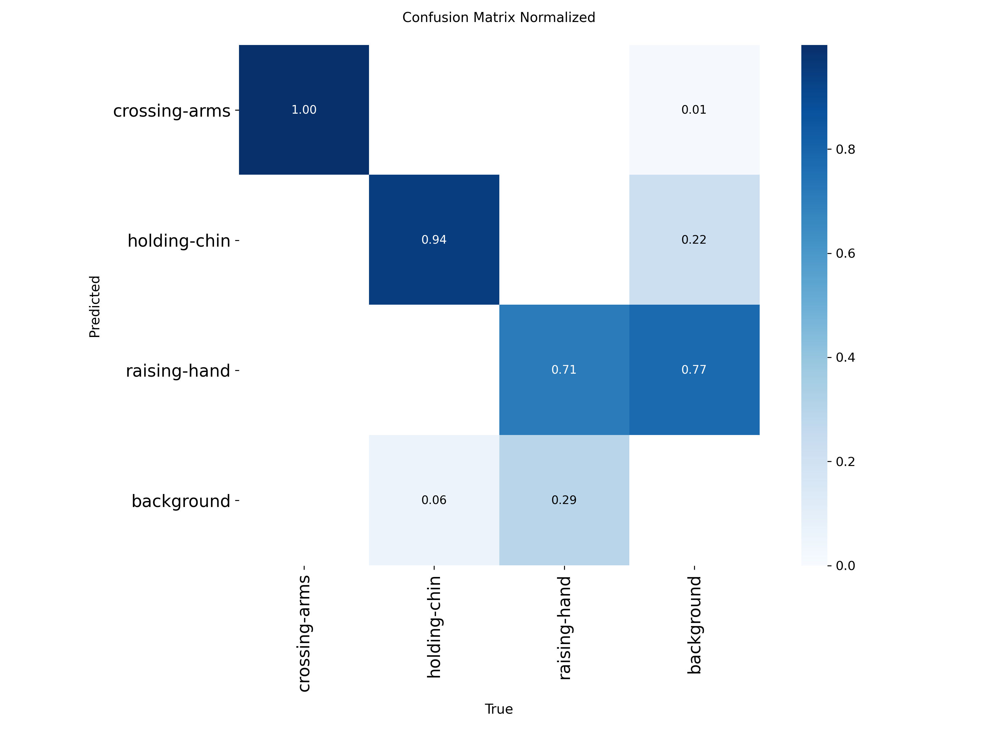

In [8]:
train_run_dir = Result_finalmodel.save_dir

display(Image(filename=os.path.join(train_run_dir, 'confusion_matrix_normalized.png')))

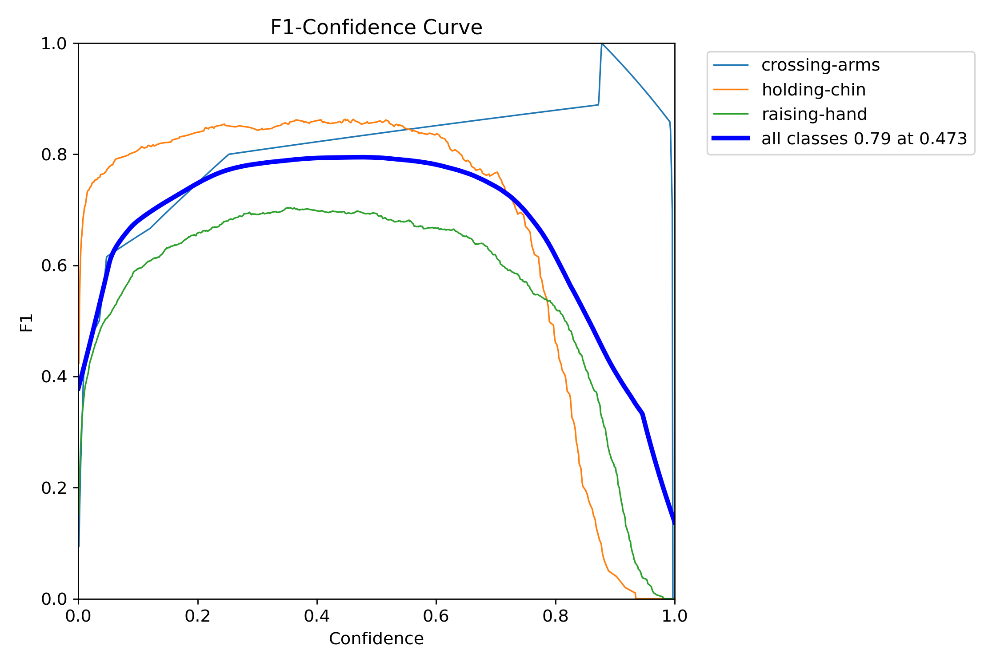

In [9]:
display(Image(filename=os.path.join(train_run_dir, 'BoxF1_curve.png')))

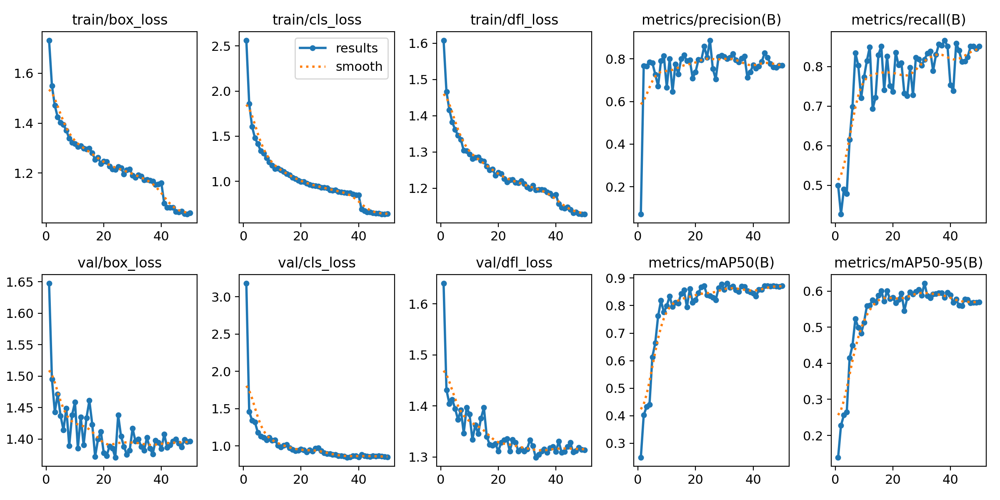

In [10]:
display(Image(filename=os.path.join(train_run_dir, 'results.png')))

# Inference

In [11]:
best_model_path = os.path.join(train_run_dir, 'weights/best.pt')
best_model = YOLO(best_model_path)
metrics = best_model.val(split='test')

Ultralytics 8.3.170 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,737 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 674.5±192.4 MB/s, size: 42.4 KB)


val: Scanning /content/Assistance-Gesture-Alert-1/test/labels... 129 images, 0 backgrounds, 0 corrupt: 100%|██████████| 129/129 [00:00<00:00, 2316.10it/s]

val: New cache created: /content/Assistance-Gesture-Alert-1/test/labels.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 9/9 [00:04<00:00,  2.09it/s]


                   all        129        366      0.783      0.853      0.914      0.627
         crossing-arms          3          3      0.528          1      0.995      0.797
          holding-chin         42         99      0.905      0.867      0.925      0.564
          raising-hand         84        264      0.915      0.692      0.821       0.52
Speed: 2.5ms preprocess, 10.3ms inference, 0.0ms loss, 4.0ms postprocess per image
Results saved to runs/detect/val


In [12]:
print("Metrik performa pada Test Set")
print("-" * 60)

print("Tinjauan Performa Training per Epoch:")
results_path = os.path.join(train_run_dir, 'results.csv')
try:
    results_df = pd.read_csv(results_path)
    results_df.columns = results_df.columns.str.strip()

    desired_columns = [
        'epoch', 'metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)',
        'metrics/mAP50-95(B)', 'val/precision(B)', 'val/recall(B)', 'val/mAP50(B)', 'val/mAP50-95(B)'
    ]
    columns_to_show = [col for col in desired_columns if col in results_df.columns]

    print("\nHasil Training:")
    if not columns_to_show:
        print("Tidak ada kolom metrik yang bisa ditampilkan dari results.csv.")
    else:
        print(results_df[columns_to_show].round(4))

except Exception as e:
    print(f"Tidak dapat membaca atau memproses file results.csv: {e}")


print("\n" + "-" * 60 + "\n")

print(f"Metrik Kinerja Final dari Model Terbaik pada Test Set:")
precision = metrics.box.p[0]
recall = metrics.box.r[0]
f1_score = metrics.box.f1[0]
map50 = metrics.box.map50
map_full = metrics.box.map

print(f"   - \033[1mPrecision:\033[0m            {precision:.4f}")
print(f"   - \033[1mRecall:\033[0m               {recall:.4f}")
print(f"   - \033[1mF1-Score:\033[0m             {f1_score:.4f}")
print(f"   - \033[1mmap50:\033[0m                {map50:.4f}")
print(f"   - \033[1mmap50:95 (mAP):\033[0m         {map_full:.4f}")

print("\n" + "-" * 60 + "\n")

print("Waktu Eksekusi per Gambar pada Test Set (rata-rata):")
speed = metrics.speed
preprocess_time = speed['preprocess']
inference_time = speed['inference']
postprocess_time = speed['postprocess']
total_time = preprocess_time + inference_time + postprocess_time

print(f"   - Waktu Pre-process:    {preprocess_time:.2f} ms")
print(f"   - Waktu Inference:      {inference_time:.2f} ms")
print(f"   - Waktu Post-process:   {postprocess_time:.2f} ms")
print(f"   - \033[1mTotal Waktu per Gambar:\033[0m {total_time:.2f} ms")

print("\n" + "-" * 60)

Metrik performa pada Test Set
------------------------------------------------------------
Tinjauan Performa Training per Epoch:

Hasil Training:
    epoch  metrics/precision(B)  metrics/recall(B)  metrics/mAP50(B)  \
0       1                0.0715             0.4995            0.2485   
1       2                0.7681             0.4267            0.4023   
2       3                0.7652             0.4899            0.4324   
3       4                0.7855             0.4789            0.4404   
4       5                0.7816             0.6158            0.6134   
5       6                0.7271             0.6982            0.6639   
6       7                0.6722             0.8340            0.7622   
7       8                0.7915             0.8030            0.8182   
8       9                0.8132             0.7205            0.7761   
9      10                0.6655             0.7733            0.7988   
10     11                0.7999             0.8147            

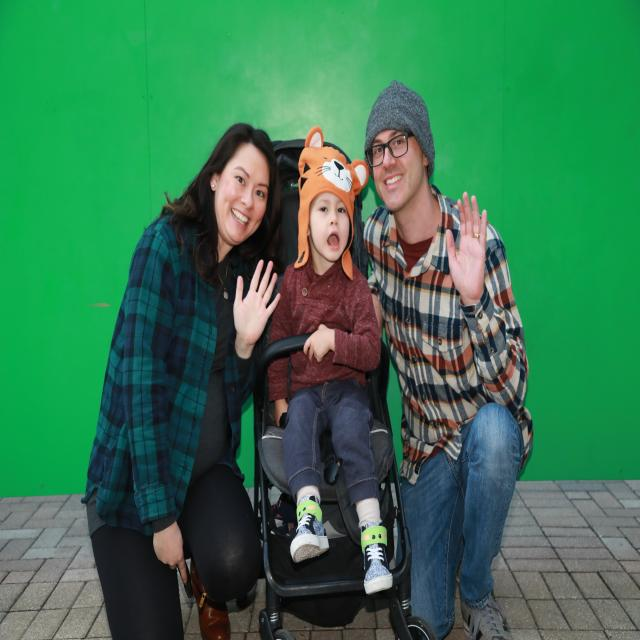


image 1/1 /content/Assistance-Gesture-Alert-1/test/images/wave-244_jpg.rf.bcf41c45dc51855f1a9af396028fc258.jpg: 640x640 4 raising-hands, 10.6ms
Speed: 3.6ms preprocess, 10.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


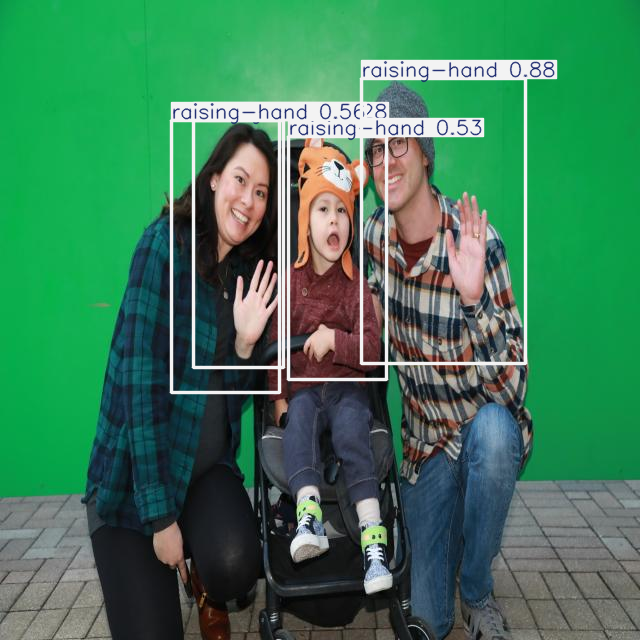

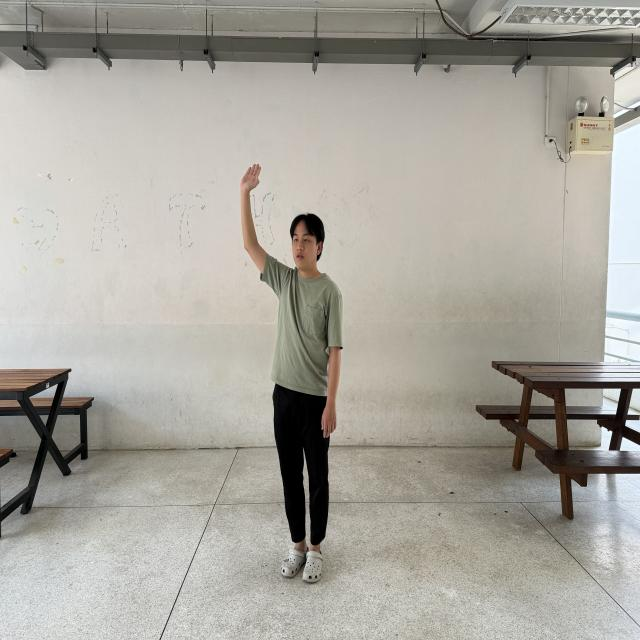


image 1/1 /content/Assistance-Gesture-Alert-1/test/images/rh_15_JPG.rf.91131d7e0d3ab5bb35fd04f42eefed36.jpg: 640x640 1 raising-hand, 12.2ms
Speed: 2.8ms preprocess, 12.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


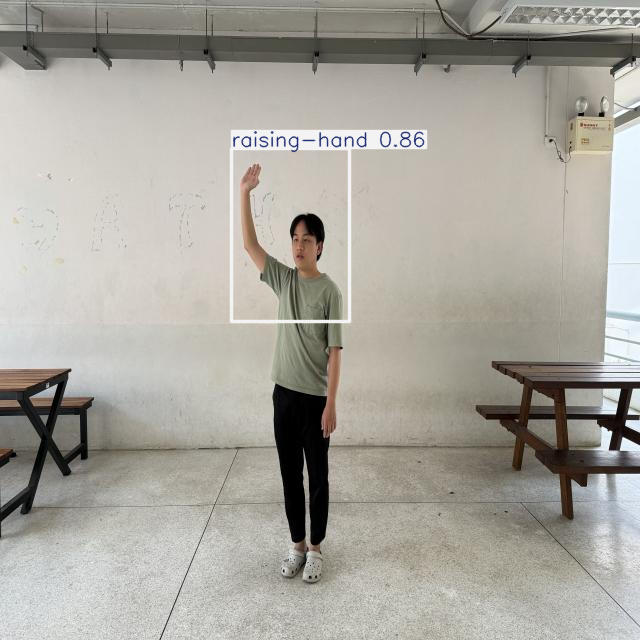

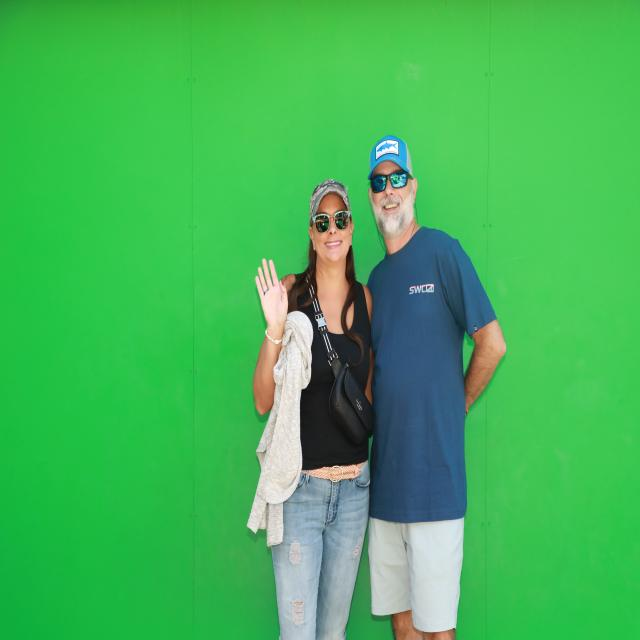


image 1/1 /content/Assistance-Gesture-Alert-1/test/images/THRE0236_JPG.rf.4647983734cbd1aa5b3849f66da8f817.jpg: 640x640 1 raising-hand, 13.2ms
Speed: 3.0ms preprocess, 13.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


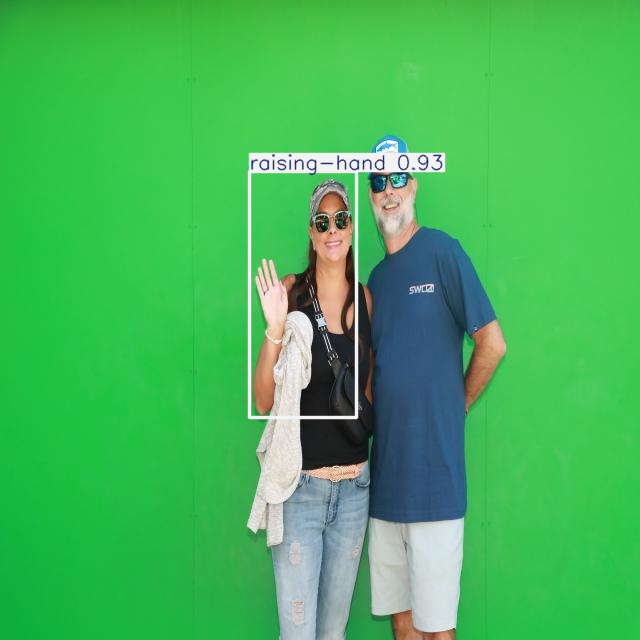

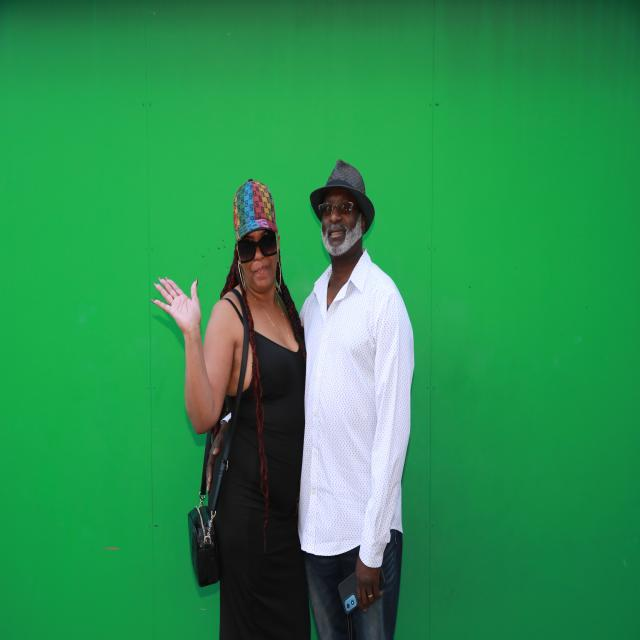


image 1/1 /content/Assistance-Gesture-Alert-1/test/images/wave-270_jpg.rf.07b80b1c64c5511f70dca6f44b80ea97.jpg: 640x640 1 raising-hand, 17.3ms
Speed: 4.3ms preprocess, 17.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


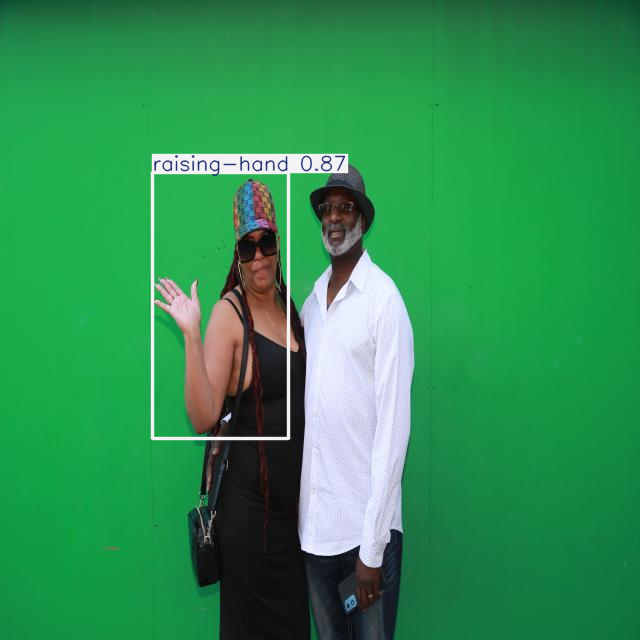

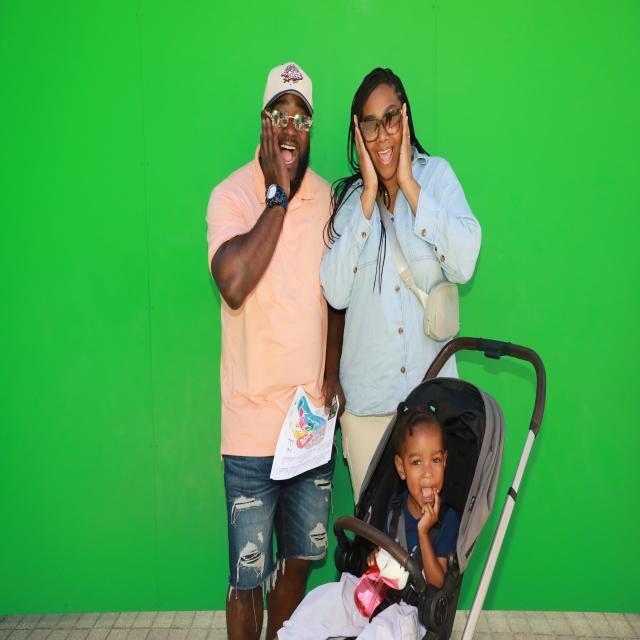


image 1/1 /content/Assistance-Gesture-Alert-1/test/images/hands-246-_JPG.rf.e7f047053679f634cc65a845e2ed1496.jpg: 640x640 2 holding-chins, 23.5ms
Speed: 2.7ms preprocess, 23.5ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)


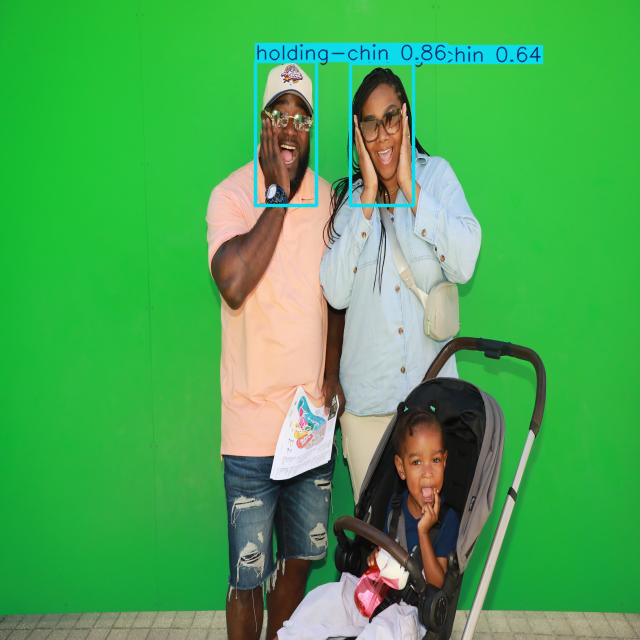

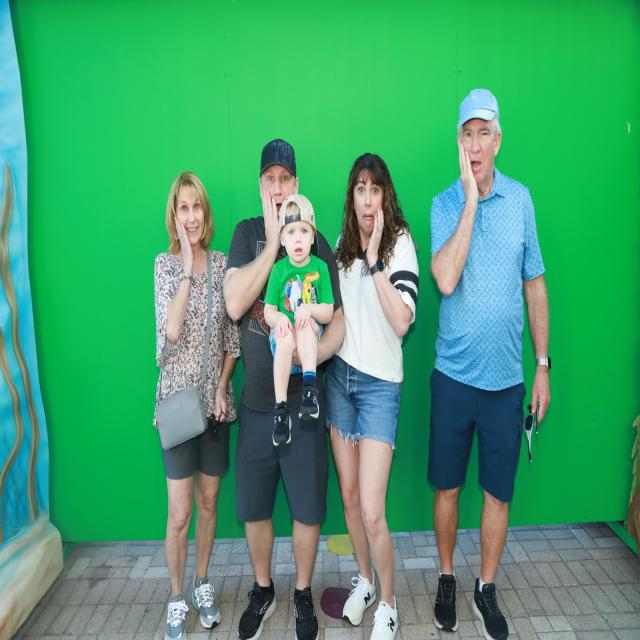


image 1/1 /content/Assistance-Gesture-Alert-1/test/images/hands-14-_jpg.rf.92abb855630c057b09feb2bfa8ab614b.jpg: 640x640 4 holding-chins, 12.2ms
Speed: 2.9ms preprocess, 12.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


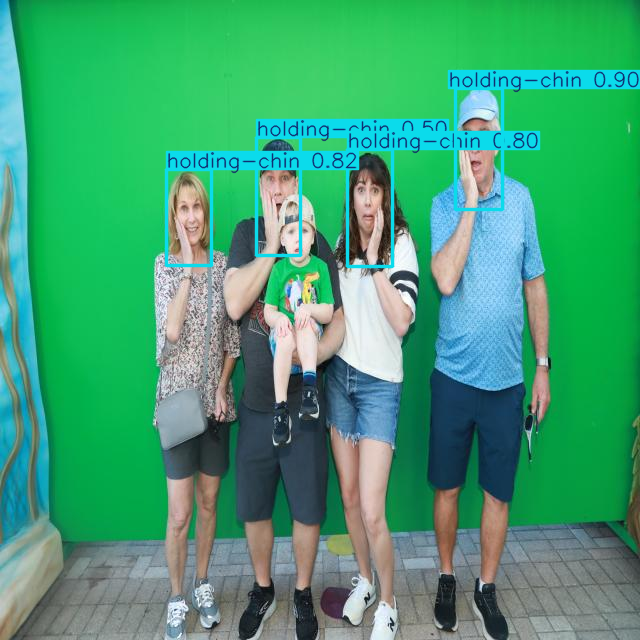

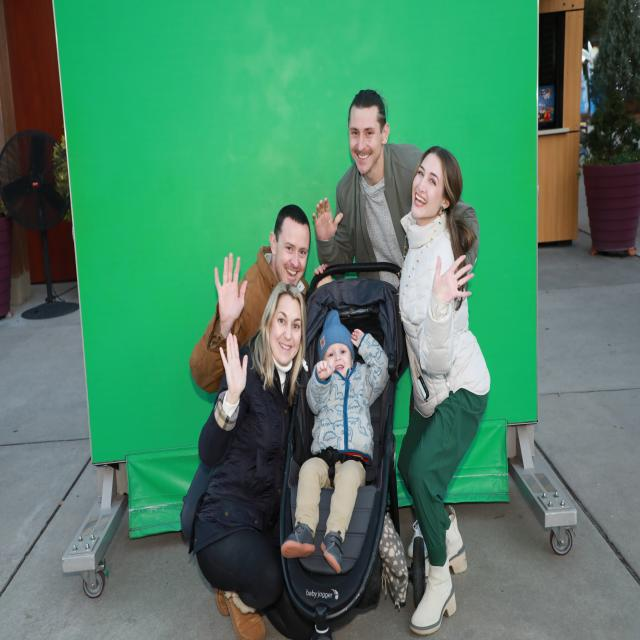


image 1/1 /content/Assistance-Gesture-Alert-1/test/images/FIVE0027_JPG.rf.b2fe34b8754f2bfffa17a8000a8d6b8a.jpg: 640x640 4 raising-hands, 13.6ms
Speed: 2.6ms preprocess, 13.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


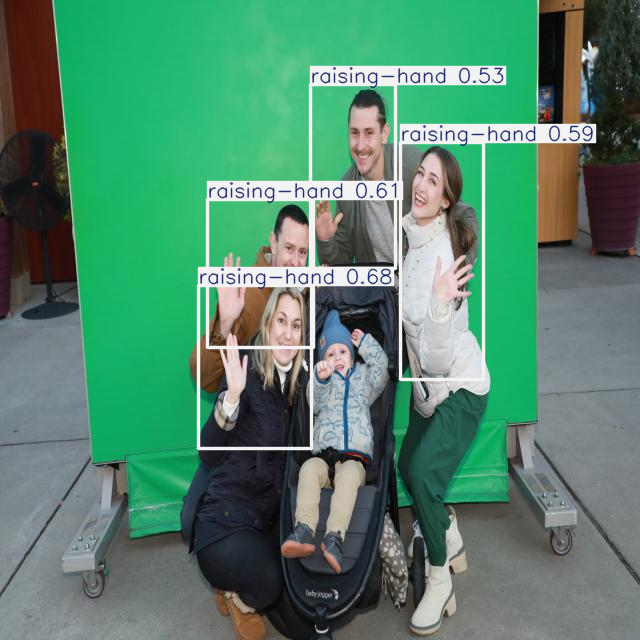

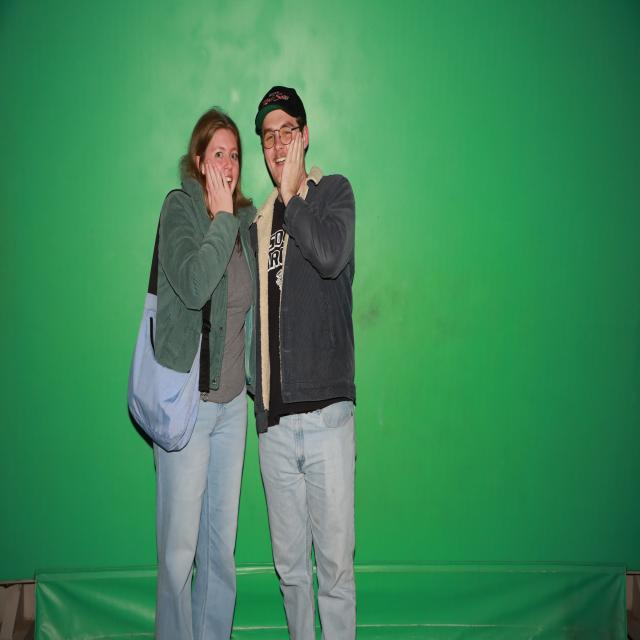


image 1/1 /content/Assistance-Gesture-Alert-1/test/images/FOUR0107_JPG.rf.8c78af19d1b05900b07c224e37a9c4a2.jpg: 640x640 2 holding-chins, 16.0ms
Speed: 2.7ms preprocess, 16.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


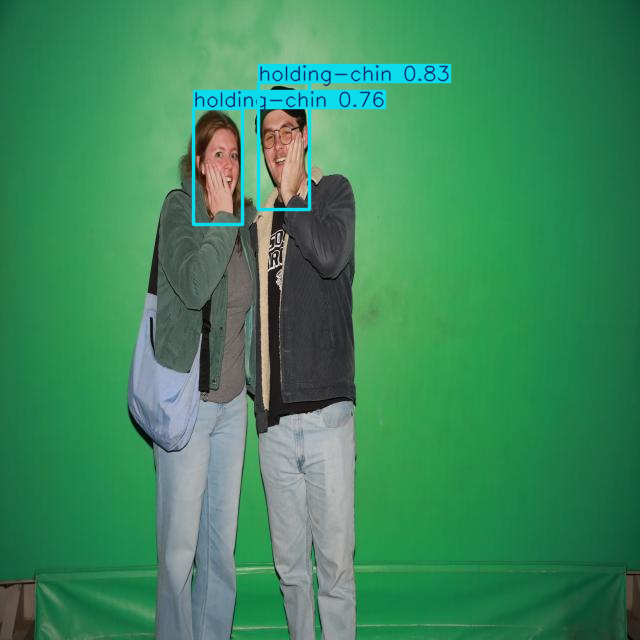

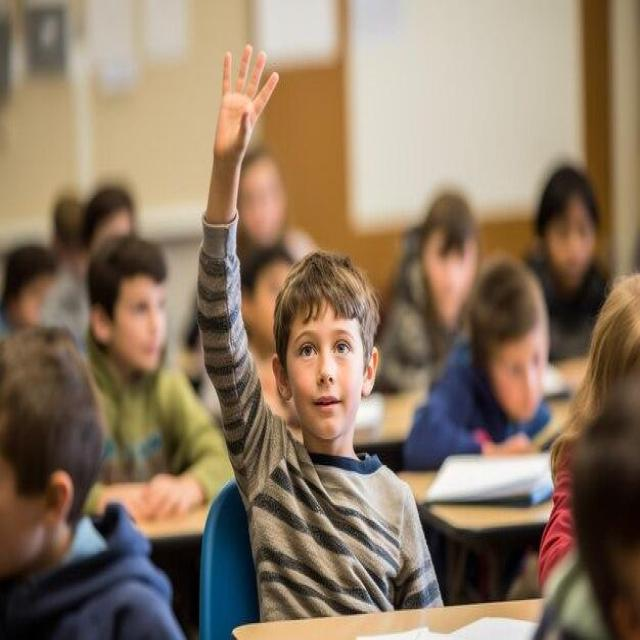


image 1/1 /content/Assistance-Gesture-Alert-1/test/images/image_50_jpg.rf.3ef752fabfa1df5e3074fbe6e1279a40.jpg: 640x640 1 raising-hand, 20.5ms
Speed: 2.5ms preprocess, 20.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


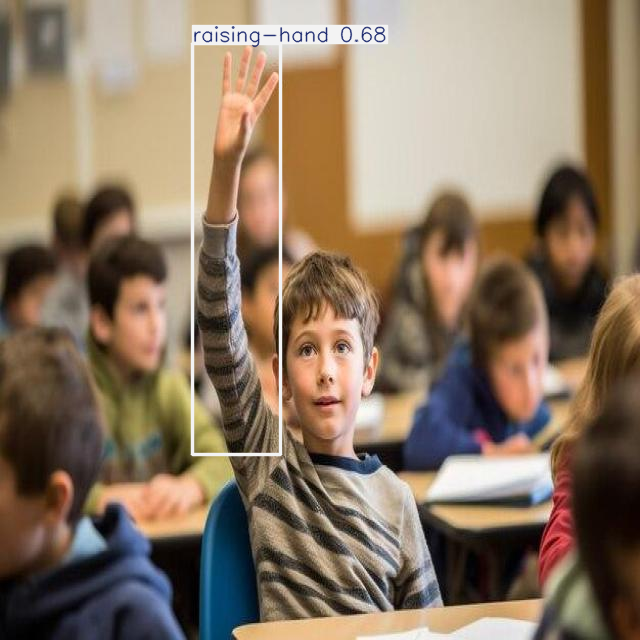

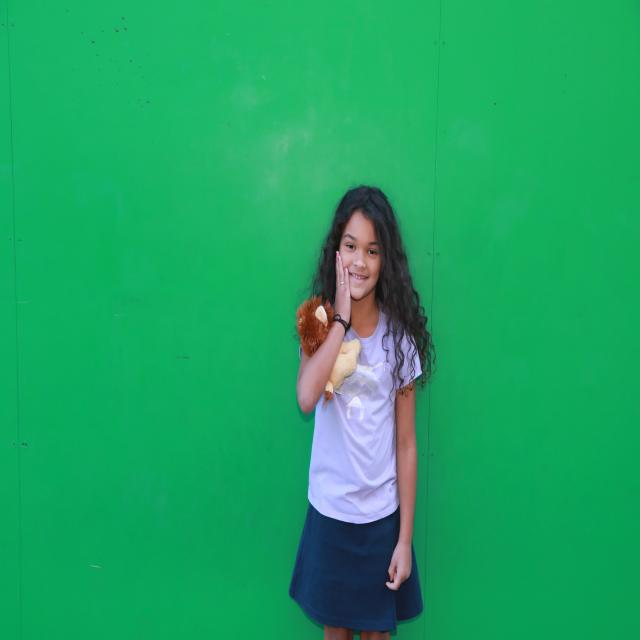


image 1/1 /content/Assistance-Gesture-Alert-1/test/images/FOUR0364_JPG.rf.46ab25aa9c6444e222a1b76f856b19cb.jpg: 640x640 1 holding-chin, 22.9ms
Speed: 2.6ms preprocess, 22.9ms inference, 5.4ms postprocess per image at shape (1, 3, 640, 640)


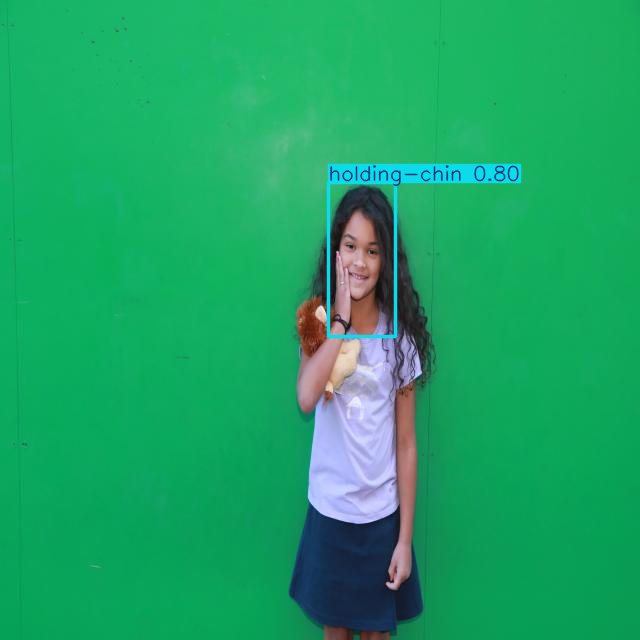

In [13]:
from PIL import Image as PILImage

image_dir = test_path
image_files = [os.path.join(image_dir, file) for file in os.listdir(image_dir)]
random_images = random.sample(image_files, k=10)

save_dir = os.path.join(project_save_dir, 'yolo_predictions')
os.makedirs(save_dir, exist_ok=True)

for image_path in random_images:
    original_image = PILImage.open(image_path)
    display(original_image)

    results = best_model.predict(source=image_path, save=False)

    plot = results[0].plot()
    plot = cv2.cvtColor(plot, cv2.COLOR_BGR2RGB)
    display(PILImage.fromarray(plot))